# Jupyter Notebook

# 1) Objective : 
-   Maximize the AUC (Area Under the Curve) of the ROC curve (Reveiver Operating Characteristic) - Ratio of TP / FP
-   f1 = 50% and Recall = 70%

# 2) EDA (Exploratory Data Analysis)
**Variable Description**
- ID	--------------- Unique identifier for the record
- Customer_ID	-------------------Unique identifier for the customer
- Month	-----------------------Month when the data was recorded
- Name	-----------------------Name of the customer
- Age	---------------------------Age of the customer
- SSN	---------------------------Social Security Number of the customer
- Occupation	-------------------Customer's occupation
- Annual_Income	---------------Customer's yearly income
- Monthly_Inhand_Salary	-------Customer's take-home salary per month
- Num_Bank_Accounts	-----------Number of bank accounts the customer holds
- Num_Credit_Card	---------------Number of credit cards the customer has
- Interest_Rate	---------------Interest rate applicable to the customer
- Num_of_Loan	-------------------Number of loans associated with the customer
- Type_of_Loan	---------------Types of loans the customer has
- Delay_from_due_date	-----------Days past due date for payments
- Num_of_Delayed_Payment	-------Number of times payments have been delayed
- Changed_Credit_Limit	-------Any changes in the credit limit
- Num_Credit_Inquiries	-------Number of credit-related inquiries
- Credit_Mix	-------------------Diversity of credit types the customer has
- Outstanding_Debt	-----------Total debt outstanding
- Credit_Utilization_Ratio	---Ratio of used credit to available credit
- Credit_History_Age	-----------Age of the customer's credit history
- Payment_of_Min_Amount	-------Indicator of minimum payment made or not
- Total_EMI_per_month	-----------Total Equated Monthly Installments paid per month
- Amount_invested_monthly	-------Monthly investment amount
- Payment_Behaviour	-----------Customer's payment habits
- Monthly_Balance	---------------Balance amount each month
- Credit_Score	---------------Customer's credit score

## Checklist (non-exhaustive)
### Form Analysis
-   **Indentification of the Target** : Credit_Score
-   **Number of Line and columns** : (70 000, 27)
-   **Types of variables** : categorical : 7, numerical : 20
-   **Missing Values** : 0

### Content Analysis
-   **Visualisation of the Target (histogram/boxplot)**:
    -   52% of Standard
    -   29% of Poor
    -   17% of Good
-   **Understanding of the different variables (histyogram/boxplot)**:

    **CONTINUOUS VARIABLE**
    - Continuous Variables NOT normalised and standardised
    - SSN -> Uniform Distribution
    - Annual_Income, Monthly_Inhand_Salary -> Skewed
    - Num_Bank_Accounts, Num_Credit_card, Num_Of_Loan, Num_of_Delayed_Payment, Num_Credit_Inquieres -> Categorical Data 

    **CATEGORICAL VARIABLE**
    - Uniform Distribution of occupations
    - Credit_Mix, Paymnent_of_min_Account -> Unbalanced Variables 
    - Payment_Behaviour -> Balanced variable
    - Type of Loan -> TOO MANY UNIQUE VALUE -> We must put each type of loan in bigger categories to classify them -> FEATURE ENGINEERING
    
-   **Visualisation de la relations features - target (histogram/boxplot)**:

    **TARGET / NUMERICAL CATEGORIES**
    - Age > 45 y -> - Poor
    - Low Annual Income -> + Poor
    - Low Monthly_Inhand_Salary -> + Poor
    - High Num_Bank_Accounts -> + Poor
    - High Num_Credit_Card -> + Poor
    - Low Num_Credit_Card -> + Good
    - Low Interest Rate -> ++ Good -> REALLY DISCRIMINANT
    - High Interest Rate -> ++ Poor -> REALLY DISCRIMINANT
    - Low Num of Loan -> + Good
    -  High Num of Loan -> + Poor
    - Low Delay from Due Date -> ++ Good -> REALLY DISCRIMINANT
    - High Delay from Due Date -> ++ Poor -> REALLY DISCRIMINANT
    - Low Num of Delayed Payment -> ++ Good -> REALLY DISCRIMINANT
    - High Num of Delayed Payment -> ++ Poor -> REALLY DISCRIMINENT
    - Low Change in Credit Limit -> + Good
    - High Num of Credit Inquiries -> + Poor
    - Low Outstanding Debt -> ++ Good -> REALLY DISCRIMINENT 
    - High Outstanding Debt -> ++ Poor -> REALLY DISCRIMINENT
    - Low Credit History Age -> ++ Poor -> REALLY DISCRIMINENT 
    - High Credit History Age -> ++ Good -> REALLY DISCRIMINENT 

    **TARGET / CATEGORICAL CATEGORIES**
    - Occupation -> No impact on the target variable
	- Credit_Mix ->
		- Stardard -> Standard 
		- Good -> Good or Standard 
		- Bad -> Poor
	- Payment_Min_Amount -> 
		-Yes -> Standard or Poor 
		- No -> Good or Standard
		- NM -> /
	- Payment_Bahaviour -> 
		- HSLV -> Standard
		- HSMV -> Standard
		- HSSV -> Standard
		- LSLV -> Standard 
		- LSMV -> Standard 
		- LSSV -> Standard or Poor
- **In-Deepth Analysis between variables**:

    **Categorical / Categorical**:
    - Some variables are highly linked
    - Credit Mix BAD / Payment of Min Amount YES 
    - Credit Mix STANDARD / Payment of Min Amount YES
    - Payment Behaviour LSSV / Payment of Min Amount YES
    
    **Numerical / Numerical**:
    - Some variables are repeated themselves (Annual Income and Monthly Inhand Salary) 
        - Corr = 1
    - Some variables are highly correlated positively (corr > 0.6)
        - Num_Delayed_Payment / Num_Bank_account
        - Delay_from_Due_Date / Interest Rate 
        - Num Credit Inquiries / Interest Rate 
        - Outstanding Debt / Interest Rate 
        - Outstanding Debt / Num of Loan 
        - Outstanding Debt / Delay from due date 
        - Outstanding Debt / Num Credit Inquiries 
        - Annual income / Monthly Balance 
        - Annual Income / Amount Invested Monthly 
    - Some variables are highly correlated  negatively (corr < -0.6)
        - Credit History Age / Interest Rate 
        - Credit History Age / Num of Loan 
        - Credit History Age / Num of Credit Inquiries 
        - Outstanding Debt / Credit History Age 

- **Null Hypothesis H0**:
    - People with a Poor Credit Score have Interest_Rate, Delay_from_Due_Date, Delayed_Paiement, Outstanding_Debt, Credit_History significaly different

    **H0 =  Interest_Rate, Delay_from_Due_Date, Delayed_Paiement, Outstanding_Debt, Credit_History are EQUAL NO MATTER THE CREDIT SCORE**

    H0 is rejected !

# 3) Pre-Processing
## Checklist (non-exhaustive)
-   Creation train/test set
-   Elimination of NaN : dropna(), imputation, empty col
-   Encoding of categorical variables
-   Delete outliers with negative impact on the model
-   Feature Selection
-   Feature Engineering (PCA after creating a lot of variables)
-   Feature Scaling 

# 4) Modelling
## Checklist (non-exhaustive)
-   Define a evaluation function
-   Train different models
-   Optimization with GridSearchCV
-   Analyze mistakes made by models and return to Preprocessing / EDA
-   Learning curve and take decision 



-----------------------------------------------------------------------------------------------------------------------

# Analyze Form of the Data

In [96]:
# Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_column', 27)

In [134]:
train_data = pd.read_csv('/Users/jojolapatate/Documents/M2 ESSEC CENTRALE/FML/Assignment2/train_set.csv', index_col=0)
test_data = pd.read_csv('/Users/jojolapatate/Documents/M2 ESSEC CENTRALE/FML/Assignment2/test_set.csv', index_col=0)


In [135]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn import svm
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.decomposition import PCA
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_predict
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_validate
from sklearn.model_selection import learning_curve
from sklearn.ensemble import AdaBoostClassifier



## Shape of the Data

In [3]:
train_data.shape

(70000, 27)

## Type of variables

In [4]:
train_data.dtypes.value_counts()

float64    18
object      7
int64       2
Name: count, dtype: int64

In [5]:
train_data.dtypes

Customer_ID                   int64
Month                         int64
Name                         object
Age                         float64
SSN                         float64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Num_of_Loan                 float64
Type_of_Loan                 object
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
Credit_Score                 object
dtype: object

## Missing values

<Axes: ylabel='ID'>

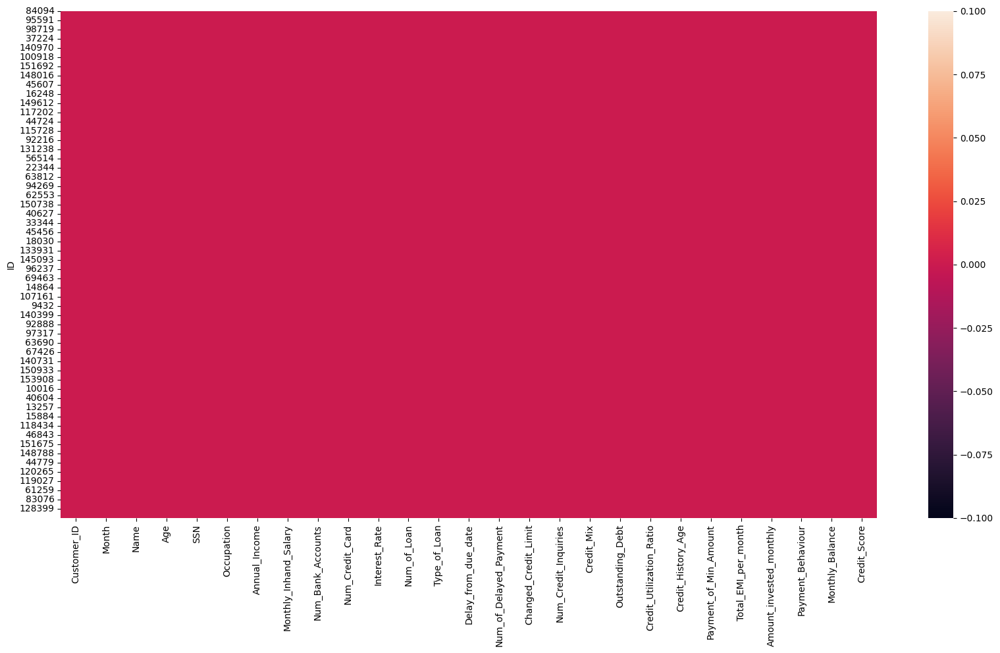

In [6]:
plt.figure(figsize=(20,10))
sns.heatmap(train_data.isna())

In [7]:
train_data.isna().sum()

Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [35]:

categorical_columns = ['Credit_Mix',
                      'Month',
                      'Occupation',
                      'Payment_Behaviour',
                      'Payment_of_Min_Amount',
                      'Type_of_Loan',
                      'Customer_ID',
                      'Name',
                      'SSN']


numerical_columns = ['Age',
                            'Num_Bank_Accounts',
                            'Num_Credit_Card',
                            'Interest_Rate',
                            'Num_of_Loan',
                            'Delay_from_due_date',
                            'Num_of_Delayed_Payment',
                            'Num_Credit_Inquiries',
                            'Credit_History_Age',
                            'Credit_Utilization_Ratio',
                           'Annual_Income',
                           'Monthly_Inhand_Salary', 
                           'Changed_Credit_Limit', 
                           'Outstanding_Debt', 
                           'Total_EMI_per_month',
                           'Amount_invested_monthly', 
                           'Monthly_Balance']

# Feature to predict
label_to_predict = 'Credit_Score'

# Content Analysis of the Data

### Elimination of Customer ID (no information provided)

In [8]:
train_data = train_data.drop(['Customer_ID', 'Name', 'SSN'], axis=1)

### Visualisation of the Target

In [9]:
train_data['Credit_Score'].value_counts(normalize=True)

Credit_Score
Standard    0.529714
Poor        0.291414
Good        0.178871
Name: proportion, dtype: float64

<Axes: ylabel='count'>

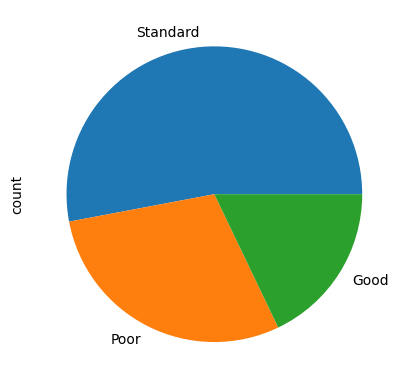

In [10]:
train_data['Credit_Score'].value_counts().plot.pie()

### Histogram of Continuous Variables

/var/folders/dj/drqjc_c134xgs5ns31syhsm40000gn/T/ipykernel_39890/2531453494.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data[col])
/var/folders/dj/drqjc_c134xgs5ns31syhsm40000gn/T/ipykernel_39890/2531453494.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data[col])
/var/f

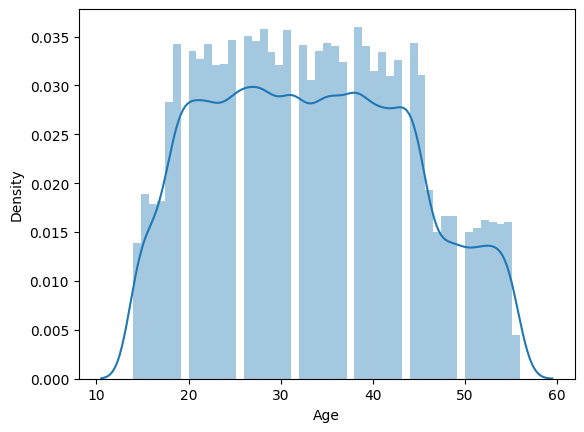

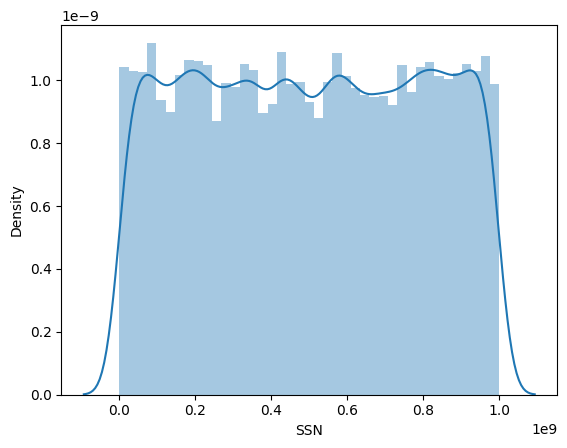

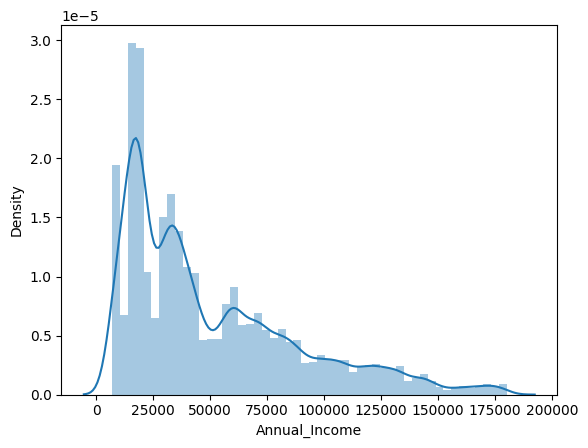

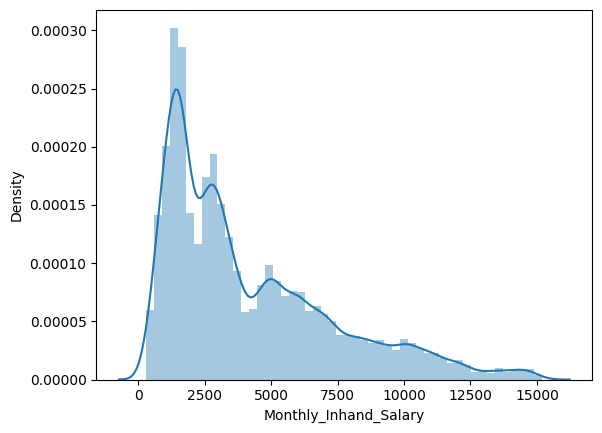

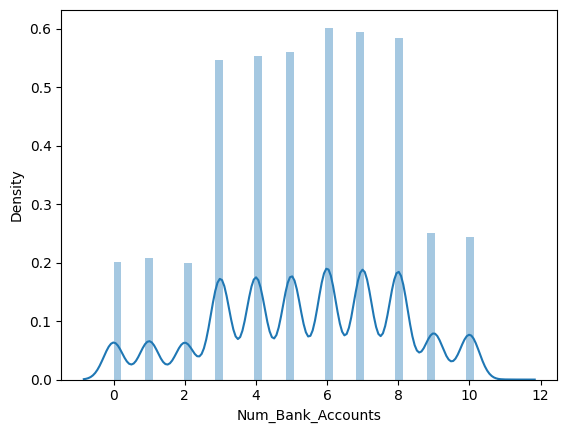

...

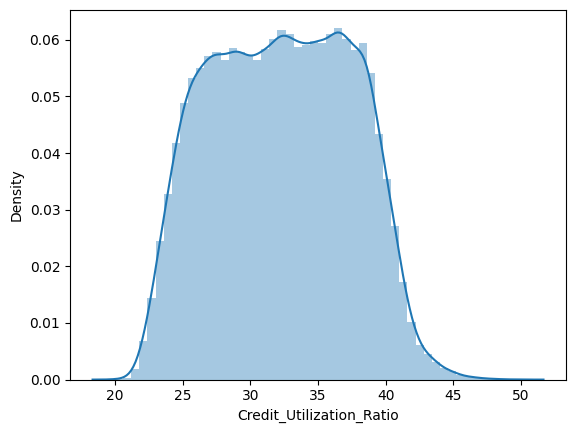

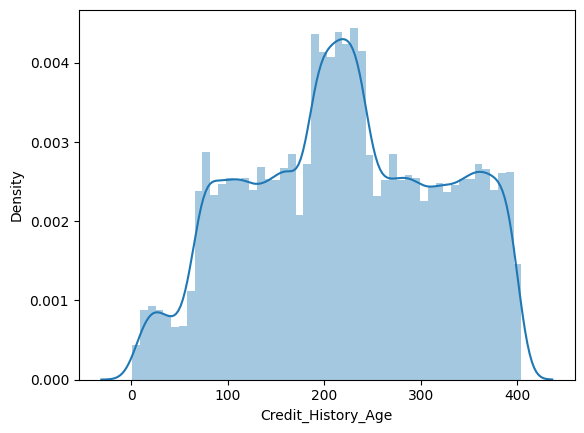

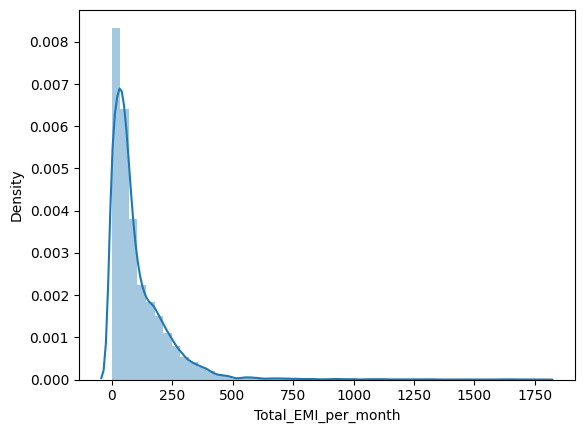

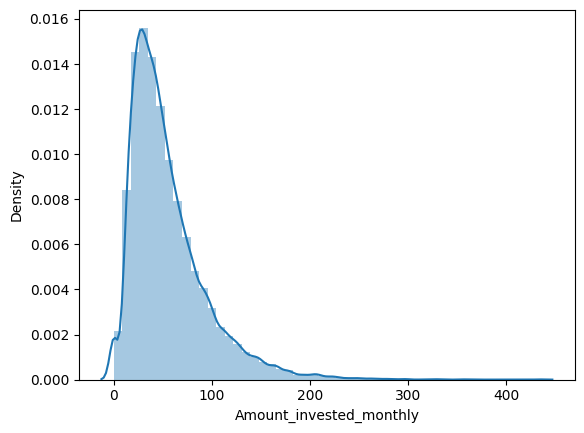

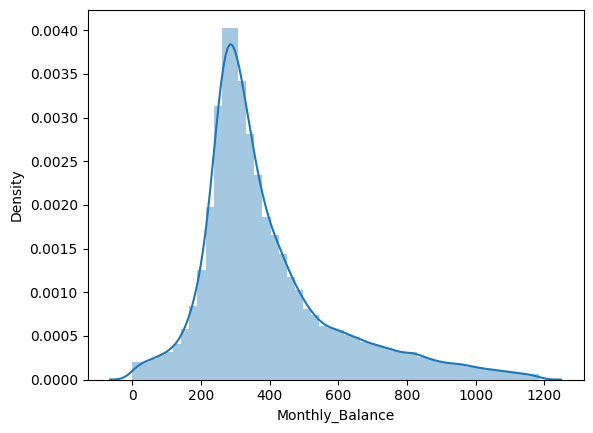

In [11]:
for col in train_data.select_dtypes('float'):
    plt.figure()
    sns.distplot(train_data[col])

### Histogram of Categorical Variables

In [12]:
for col in train_data.select_dtypes('object'):
    print(f'{col :-<50}, {train_data[col].unique()}')

Occupation----------------------------------------, ['Journalist' 'Teacher' 'Developer' 'Entrepreneur' 'Manager' 'Architect'
 'Media_Manager' 'Mechanic' 'Doctor' 'Scientist' 'Accountant' 'Musician'
 'Writer' 'Lawyer' 'Engineer']
Type_of_Loan--------------------------------------, ['payday loan,mortgage loan,student loan,not specified,home equity loan'
 'credit-builder loan,mortgage loan' 'No Data' ...
 'mortgage loan,home equity loan,home equity loan,personal loan,debt consolidation loan,personal loan,payday loan'
 'credit-builder loan,auto loan,credit-builder loan,not specified,auto loan,credit-builder loan,debt consolidation loan'
 'auto loan,home equity loan,payday loan,mortgage loan,student loan,student loan']
Credit_Mix----------------------------------------, ['Bad' 'Standard' 'Good']
Payment_of_Min_Amount-----------------------------, ['Yes' 'NM' 'No']
Payment_Behaviour---------------------------------, ['Low_spent_Small_value_payments' 'Low_spent_Medium_value_payments'
 'High_s

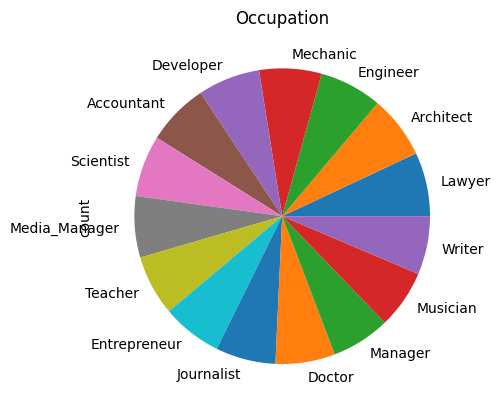

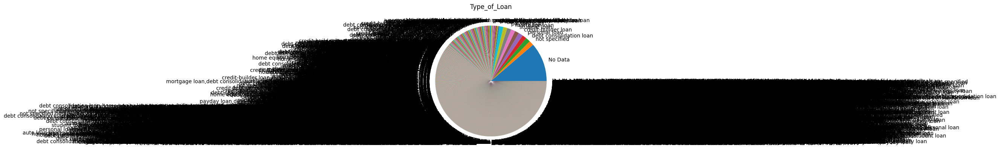

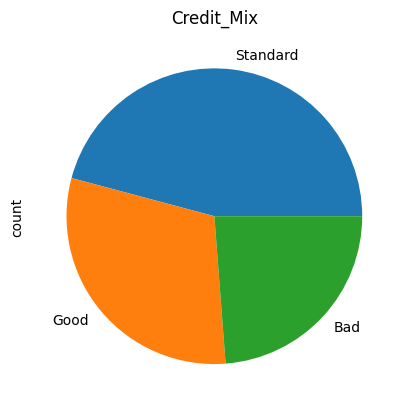

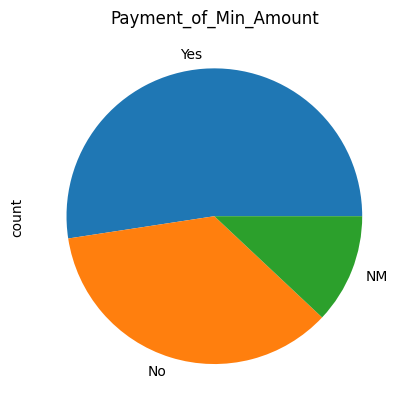

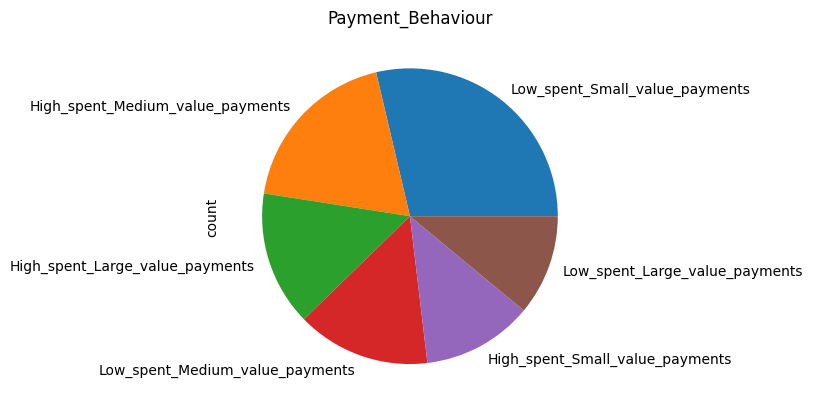

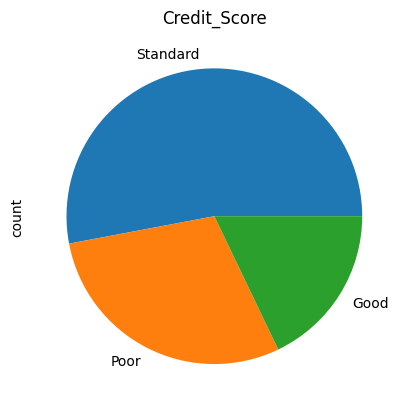

In [13]:
for col in train_data.select_dtypes('object'):
    plt.figure()
    plt.title(col)
    train_data[col].value_counts().plot.pie()

### Target / Variables Relation
#### Creation of 3 subsets (Poor, Standard, Good)

In [52]:
from sklearn import preprocessing

def normalize(train_data):
    scaler = preprocessing.StandardScaler()
    for col in train_data.select_dtypes('float'):
        # Fit on the column and transform it
        train_data[col] = scaler.fit_transform(train_data[[col]])

    return train_data

train_data = normalize(train_data)


In [101]:

train_data['tested'] = (train_data['Num_of_Delayed_Payment']+train_data['Delay_from_due_date'])+(train_data['Num_Bank_Accounts']*\
                        +train_data['Num_Credit_Card'])


good = train_data[train_data['Credit_Score'] == 'Good']
standard = train_data[train_data['Credit_Score'] == 'Standard']
poor = train_data[train_data['Credit_Score'] == 'Poor']


#### Relation Target / Numerical Variables

/var/folders/bv/5s8wgnqx04n66t4k9rrp0ygh0000gn/T/ipykernel_53000/4274862013.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(good['tested'], label='Good')
/var/folders/bv/5s8wgnqx04n66t4k9rrp0ygh0000gn/T/ipykernel_53000/4274862013.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(poor['test

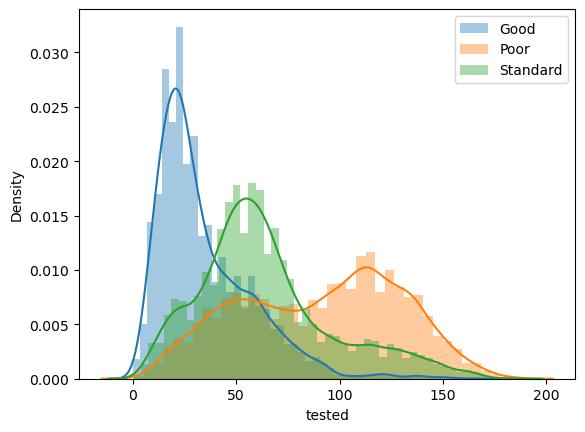

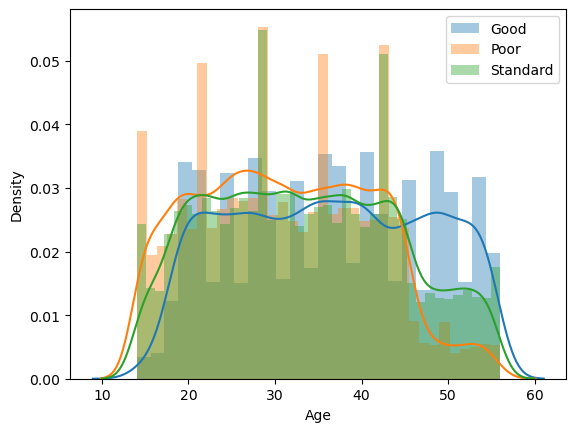

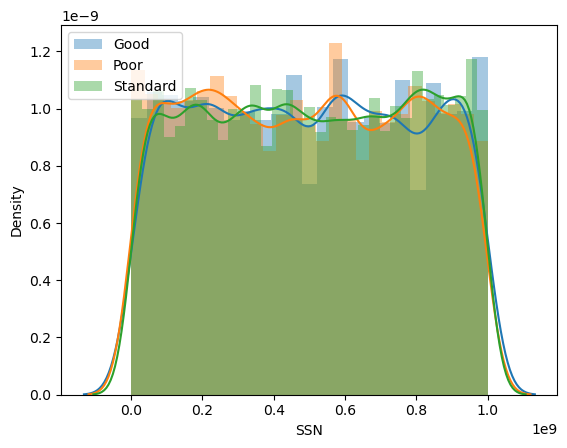

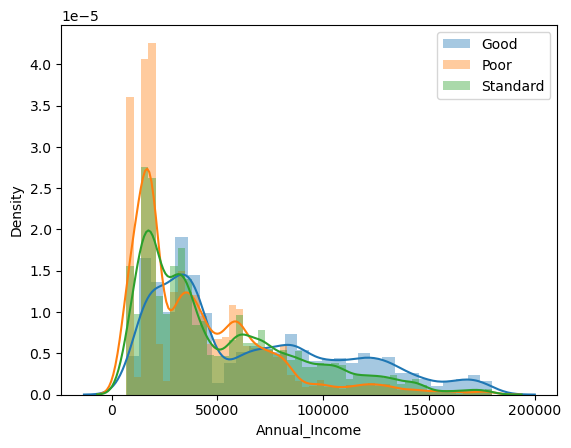

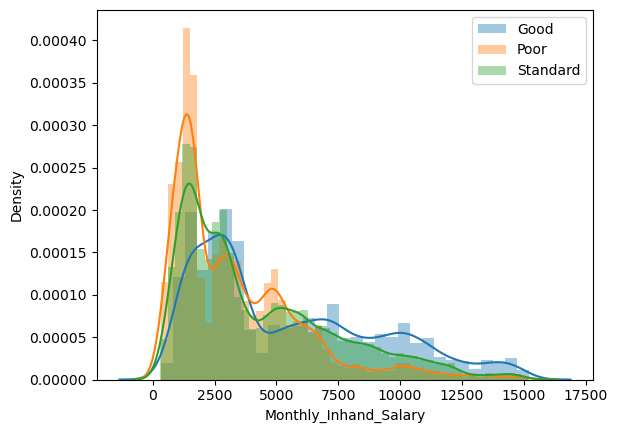

...

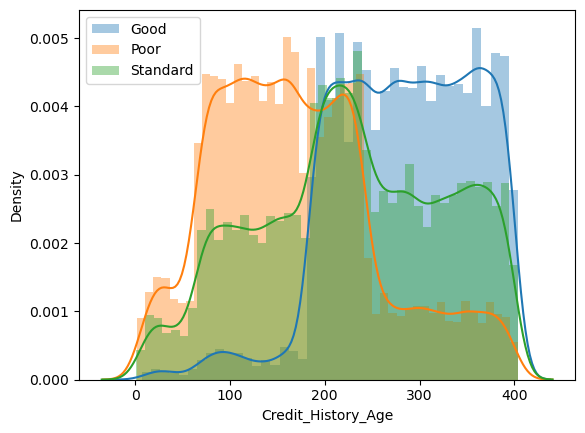

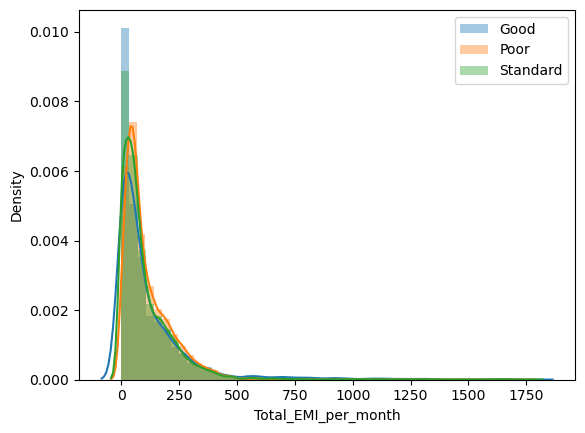

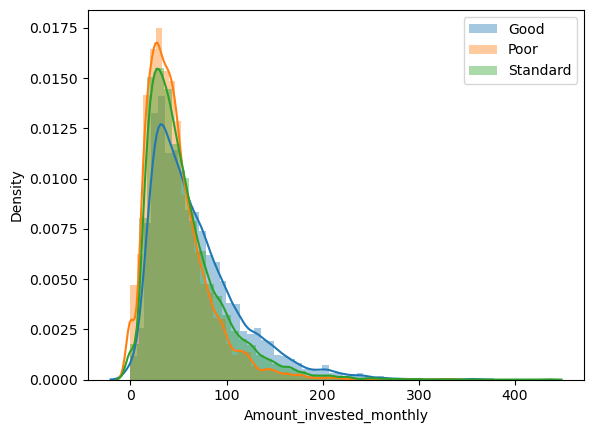

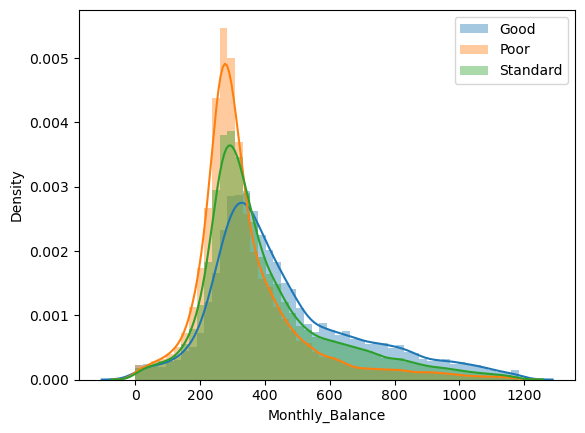

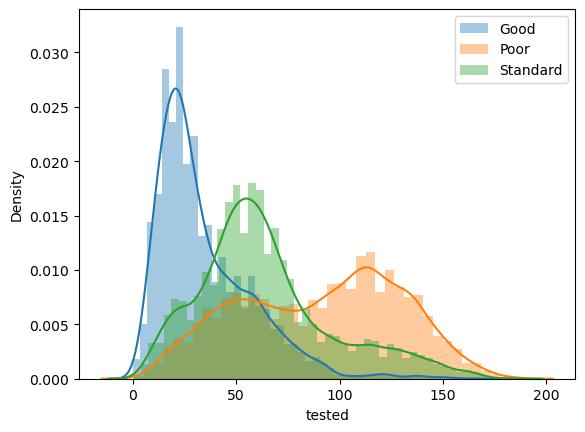

In [102]:
plt.figure()
sns.distplot(good['tested'], label='Good')
sns.distplot(poor['tested'], label='Poor')
sns.distplot(standard['tested'], label='Standard')
plt.legend()
for col in train_data.select_dtypes('float'):
    plt.figure()
    sns.distplot(good[col], label='Good')
    sns.distplot(poor[col], label='Poor')
    sns.distplot(standard[col], label='Standard')
    plt.legend()

#### Relation Target / Categorical Variables

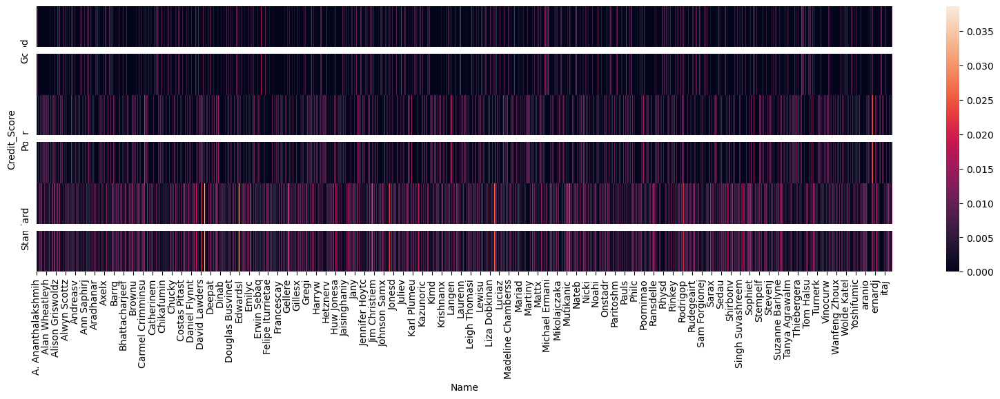

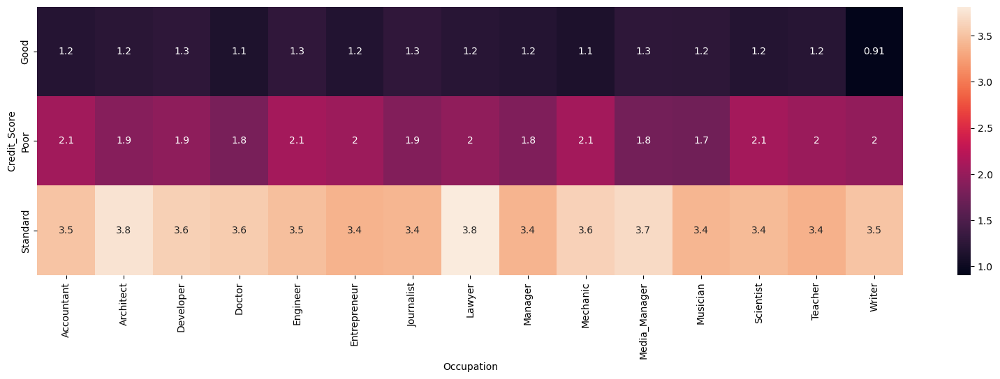

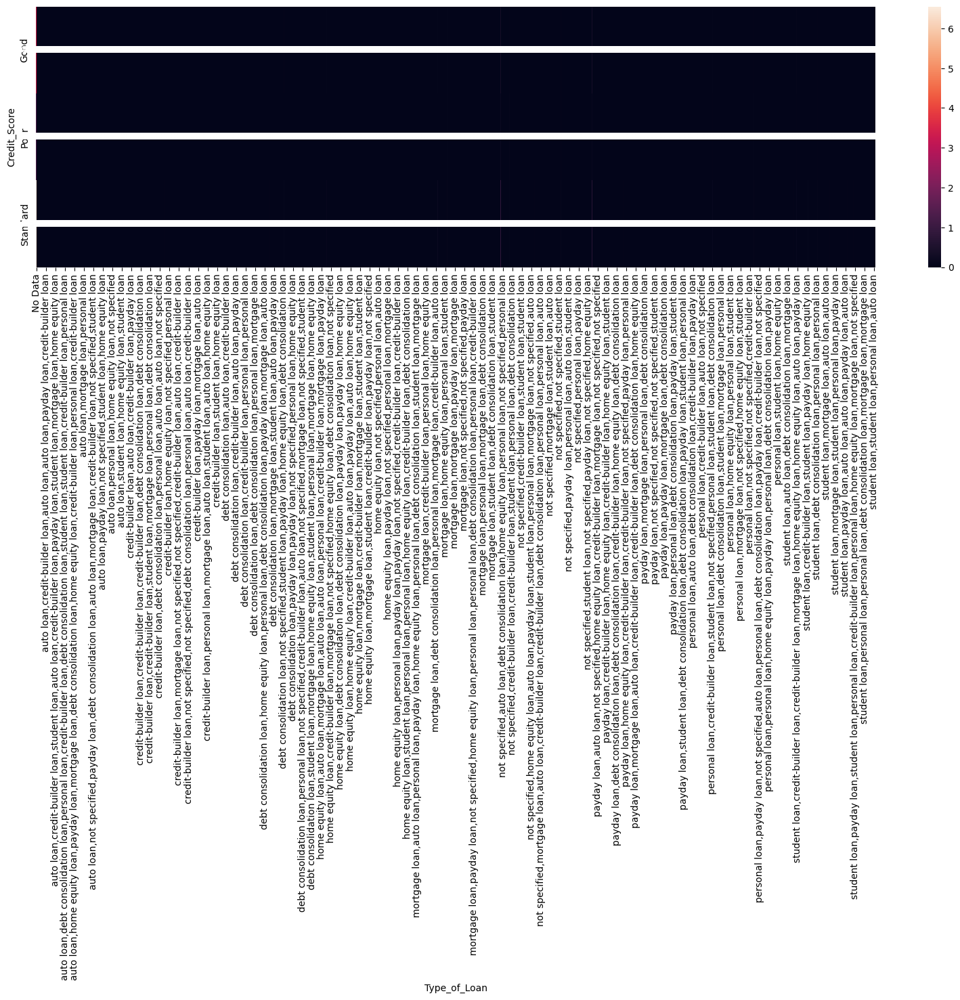

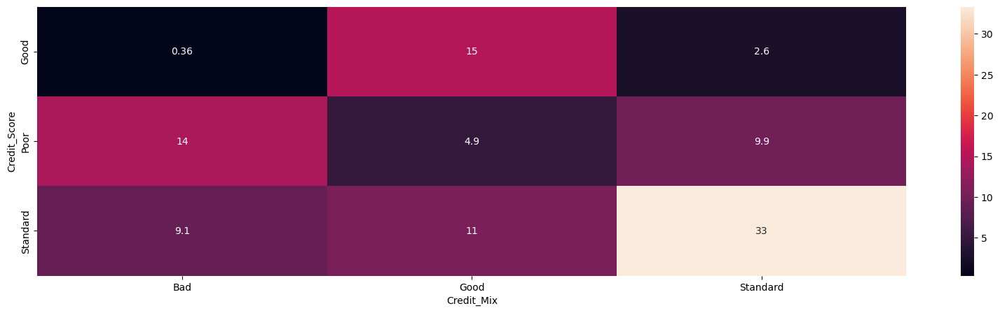

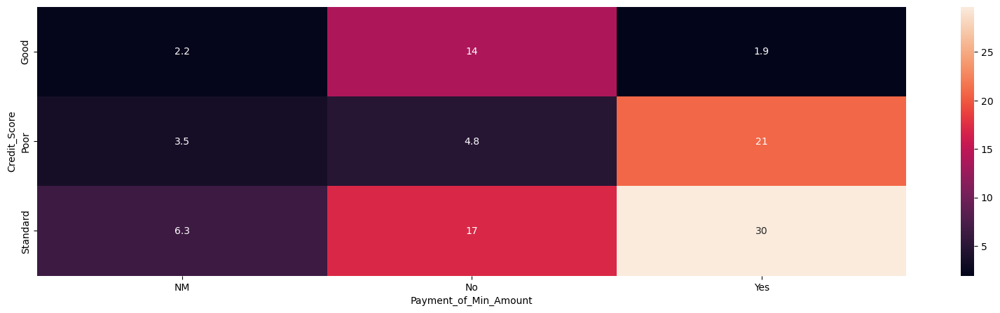

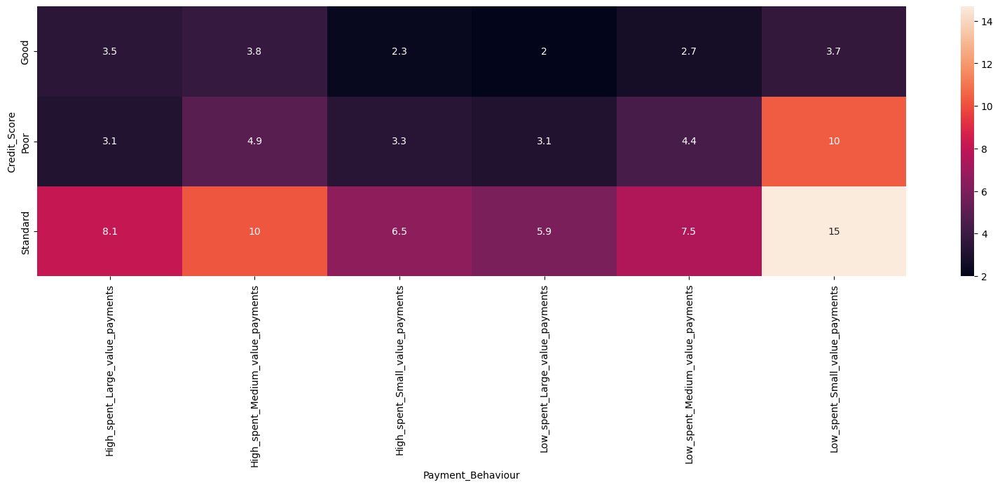

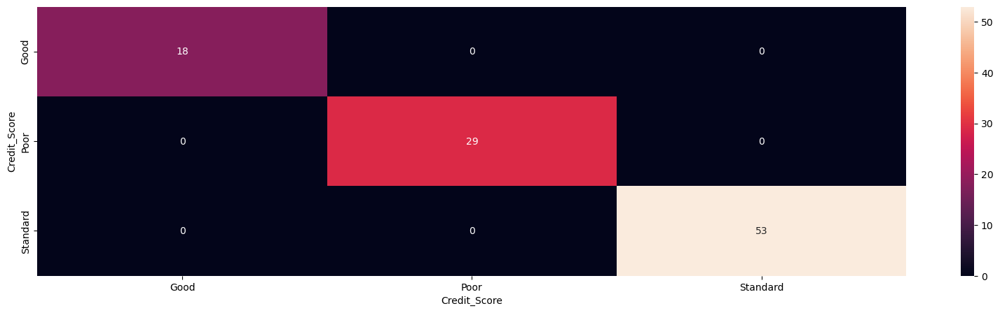

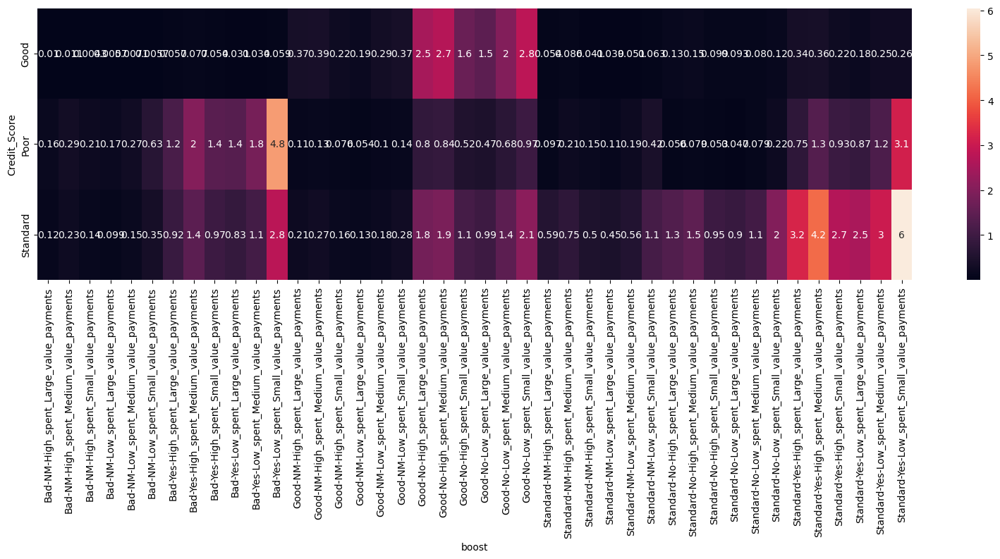

In [138]:
train_data['boost'] = train_data['Credit_Mix']+'-'+train_data['Payment_of_Min_Amount']+'-'+train_data['Payment_Behaviour']
for col in train_data.select_dtypes('object'):
    plt.figure(figsize=(20,5))
    sns.heatmap( pd.crosstab(train_data['Credit_Score'], train_data[col], normalize=True) * 100, annot=True)

### In Depth Analysis 
#### Numerical / Numerical


/Users/theob/Library/Python/3.9/lib/python/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


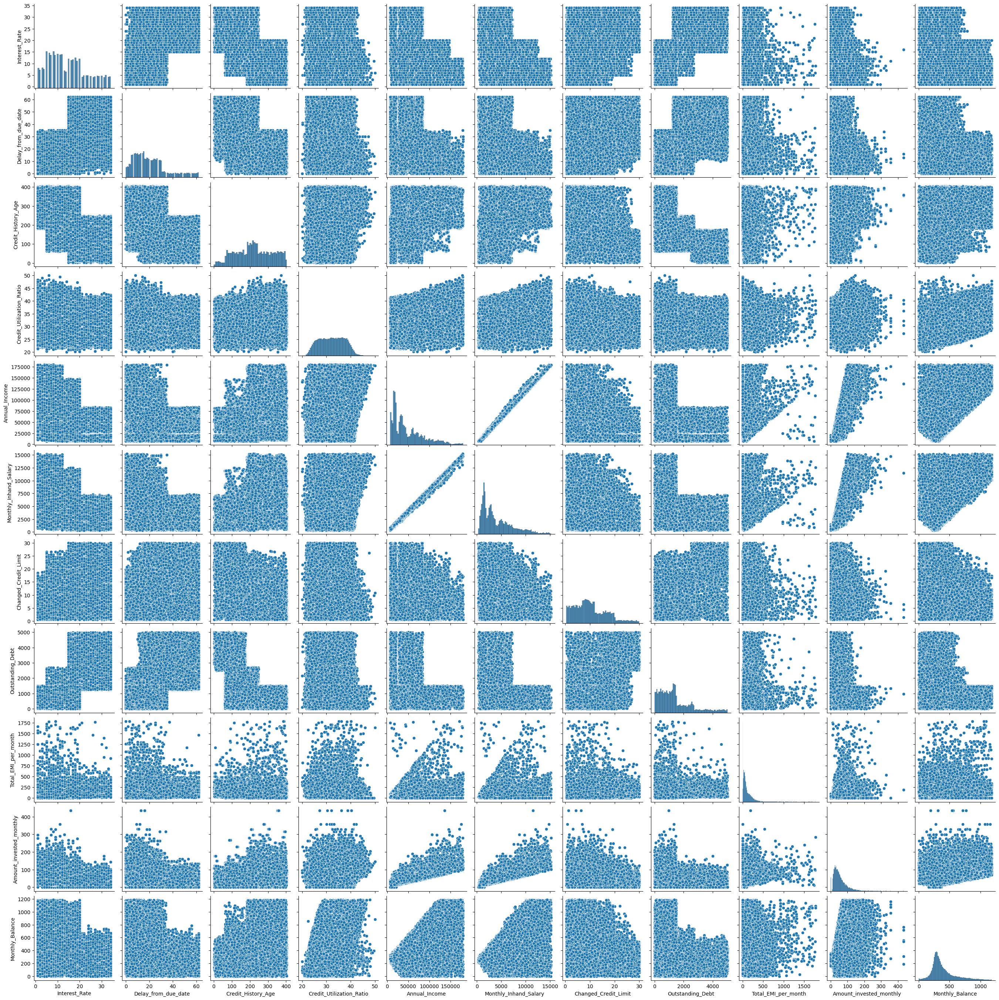

In [38]:
true_numerical_columns = ['Interest_Rate',
                            'Delay_from_due_date',
                            'Credit_History_Age',
                            'Credit_Utilization_Ratio',
                           'Annual_Income',
                           'Monthly_Inhand_Salary', 
                           'Changed_Credit_Limit', 
                           'Outstanding_Debt', 
                           'Total_EMI_per_month',
                           'Amount_invested_monthly', 
                           'Monthly_Balance']
sns.pairplot(train_data[true_numerical_columns])

<Axes: >

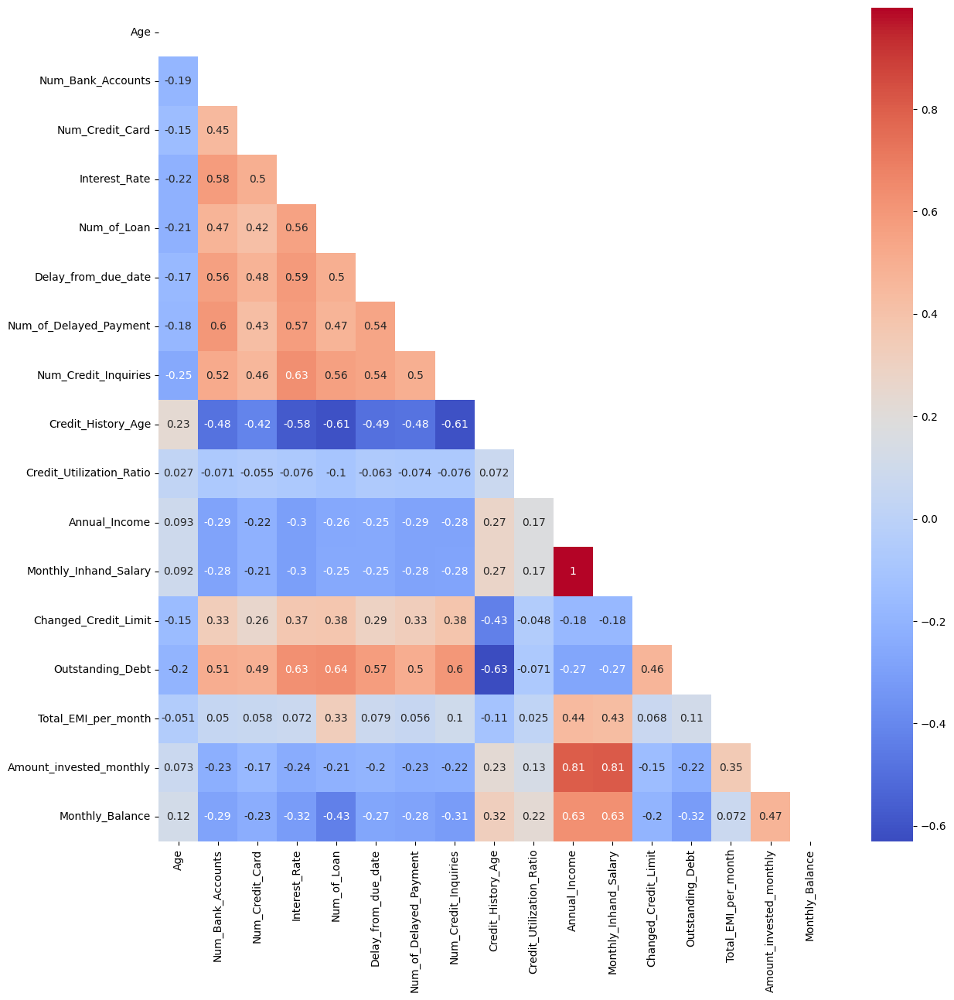

In [41]:
import numpy as np

# Calculer la corrélation entre les variables numériques
corr = train_data[numerical_columns].corr()

# Créer un masque pour cacher la moitié inférieure de la heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))

# Afficher la heatmap en utilisant le masque
plt.figure(figsize=(14, 14))
sns.heatmap(corr, annot=True, cmap='coolwarm', mask=mask)

#### Categorical / Categorical

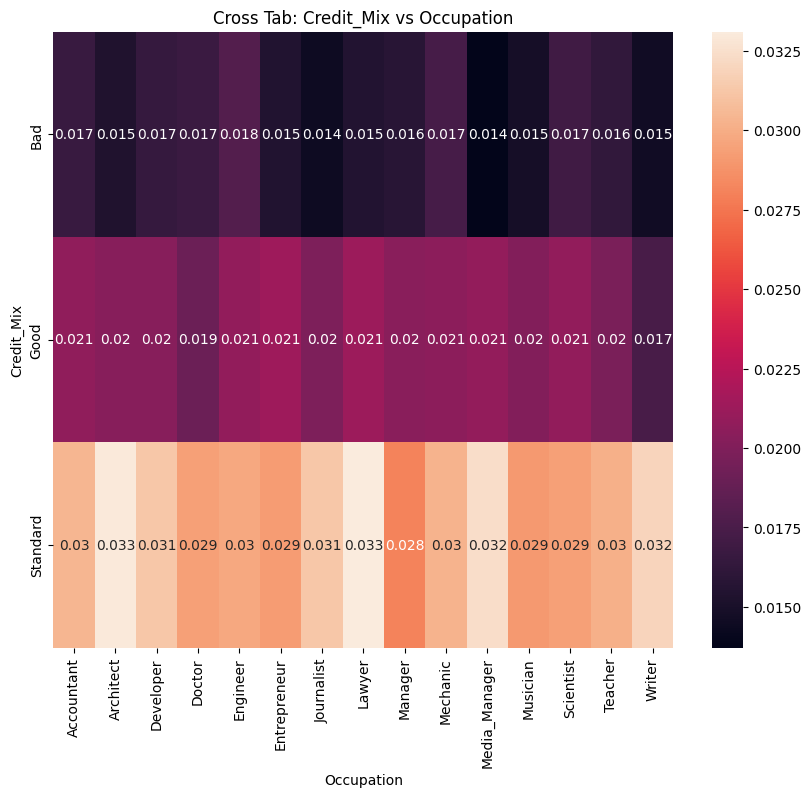

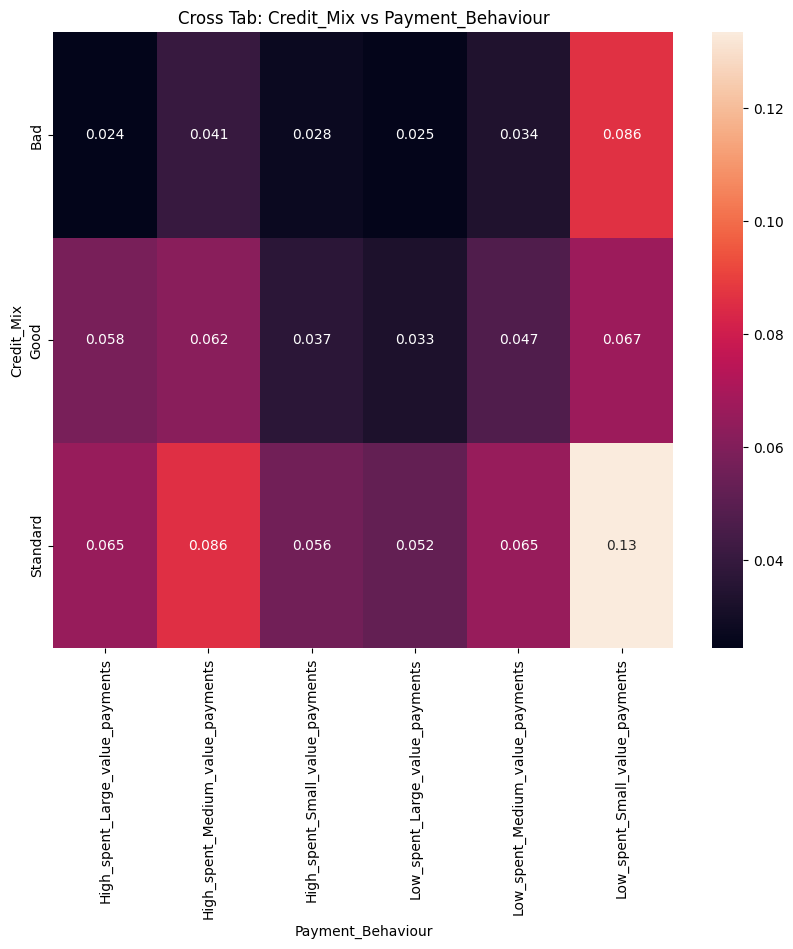

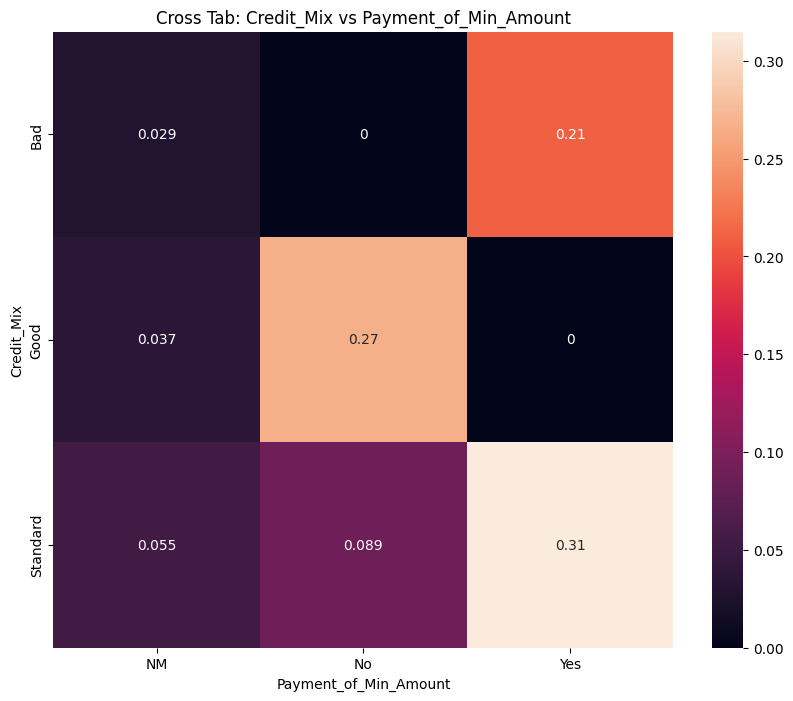

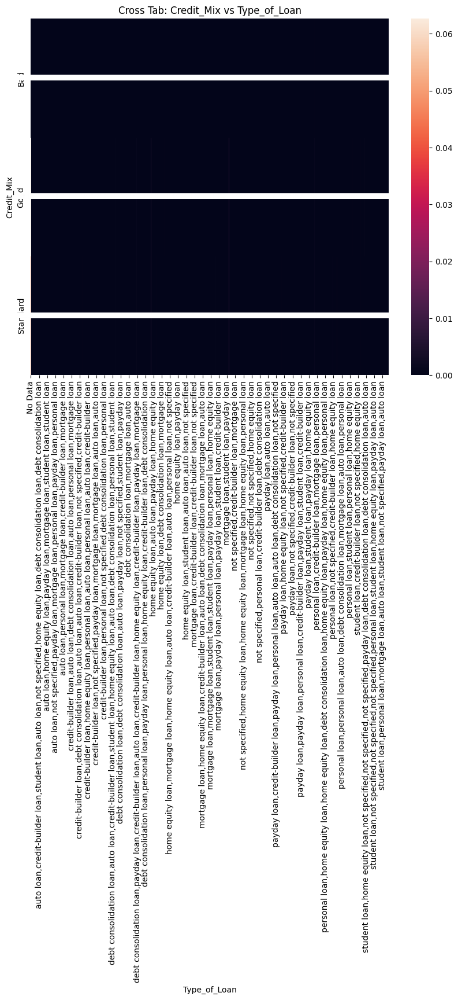

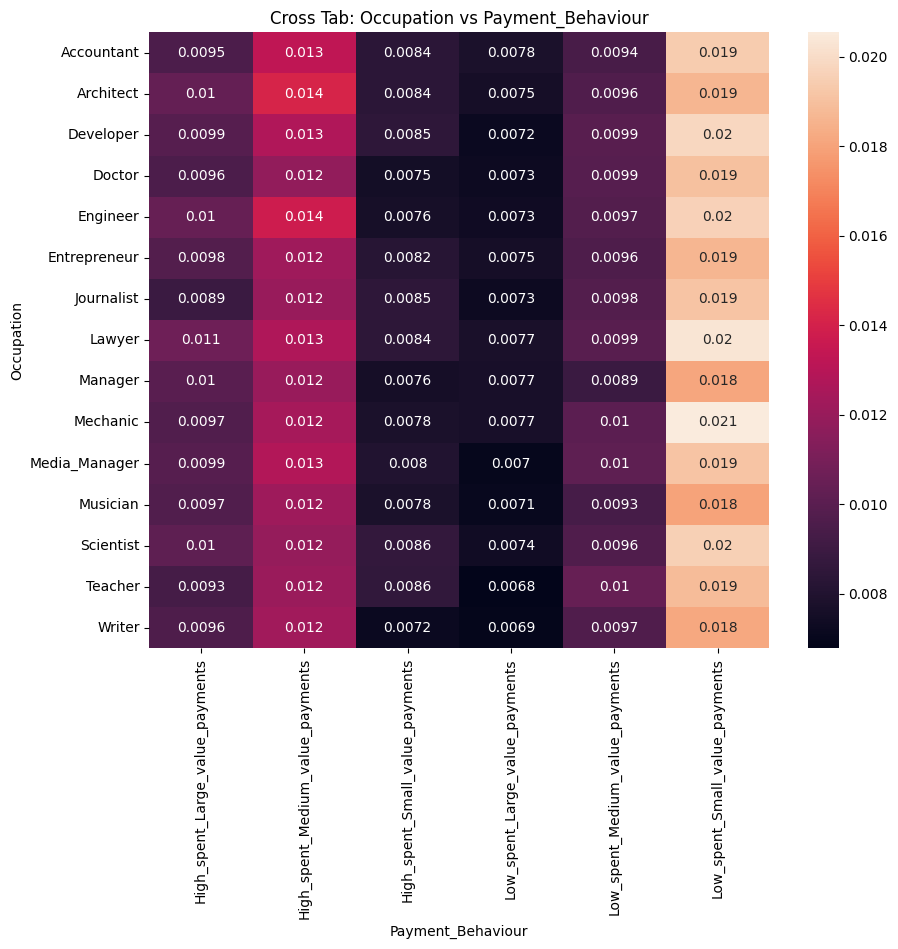

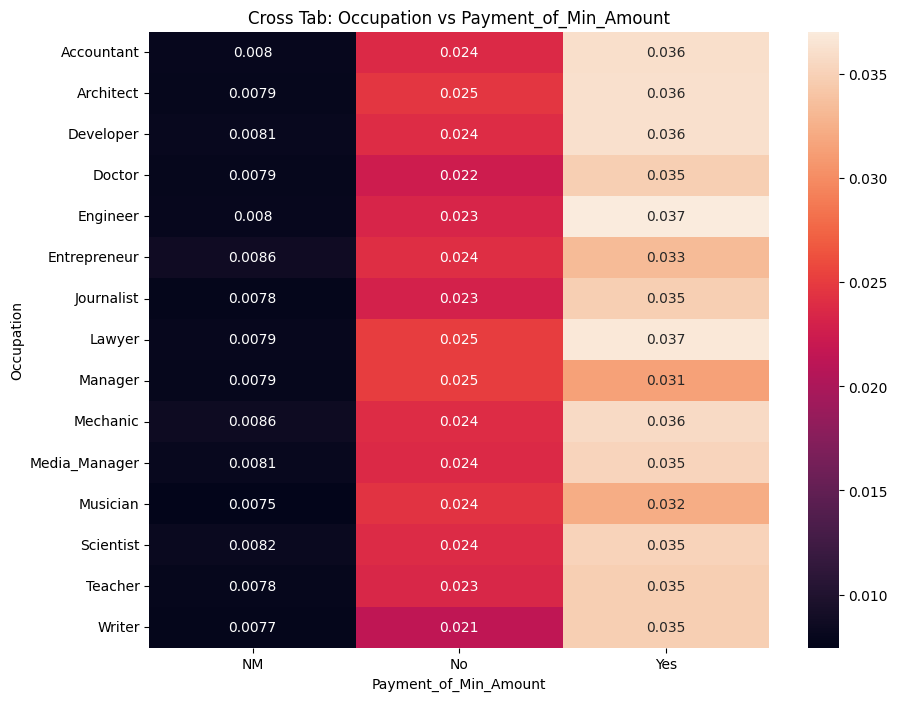

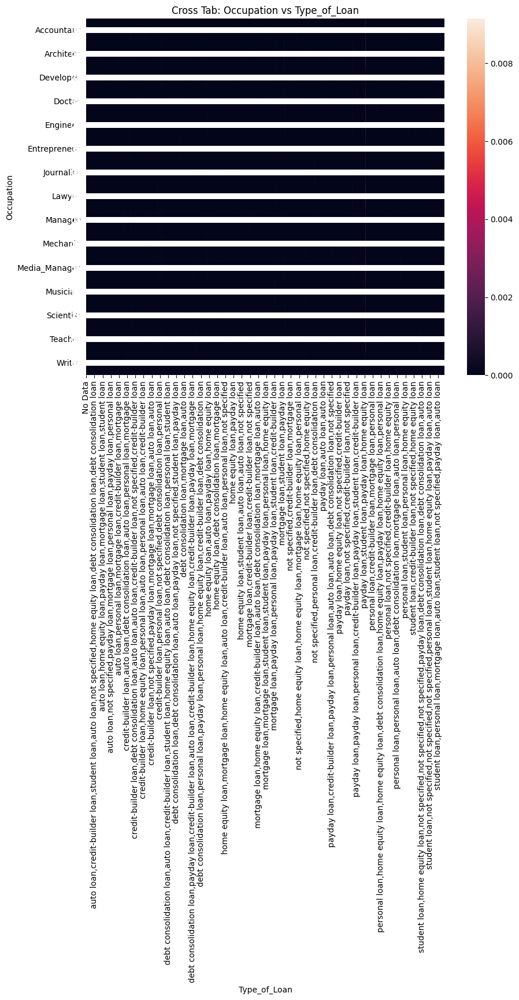

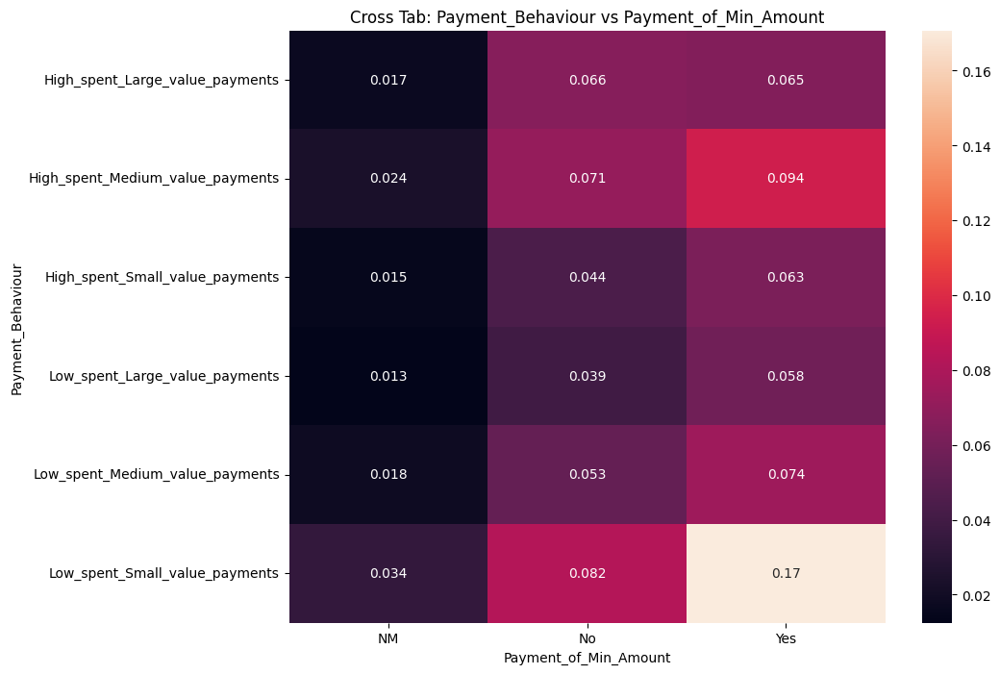

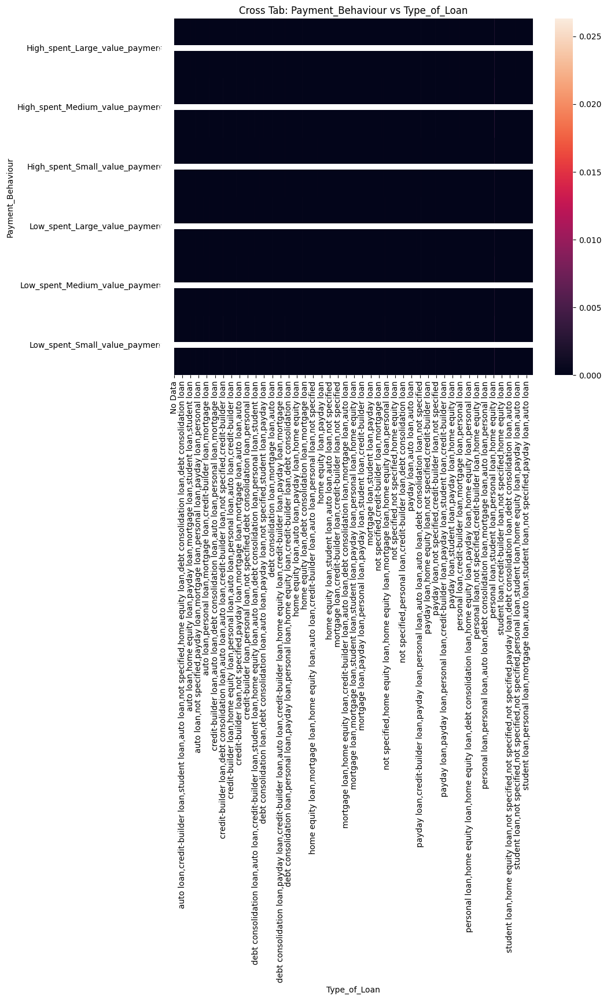

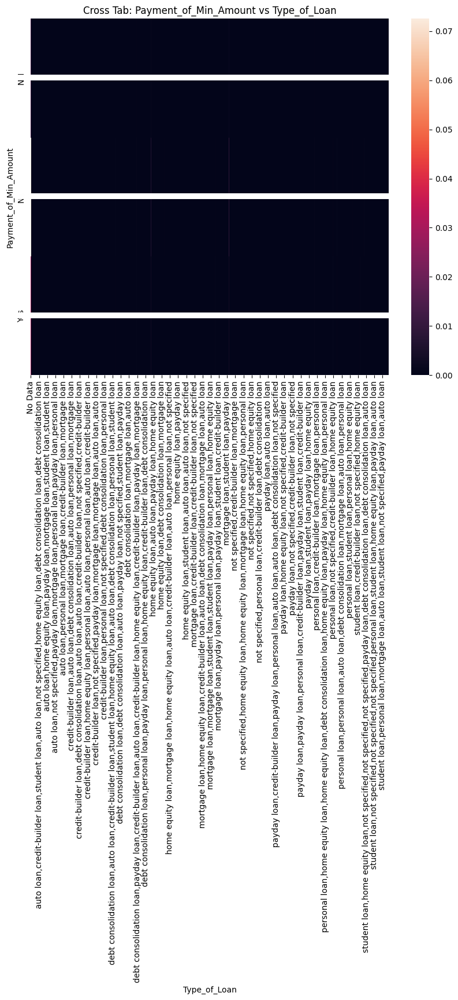

In [54]:
categorical_columns = ['Credit_Mix',
                      'Occupation',
                      'Payment_Behaviour',
                      'Payment_of_Min_Amount',
                      'Type_of_Loan']
for i in range(len(categorical_columns)):
    for j in range(i+1, len(categorical_columns)):
        col1 = categorical_columns[i]
        col2 = categorical_columns[j]
        cross_tab = pd.crosstab(train_data[col1], train_data[col2], normalize=True)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cross_tab, annot=True)
        plt.title(f'Cross Tab: {col1} vs {col2}')
        plt.show()

### Test of H0
H0 = Interest_Rate, Delay_from_Due_Date, Delayed_Paiement, Outstanding_Debt, Credit_History are EQUAL NO MATTER THE CREDIT SCORE 

Goal = Reject this hypothesis

In [56]:
from scipy.stats import ttest_ind
# We must have balanced class between Credit Score

min_value = min(good.shape[0], standard.shape[0], poor.shape[0])

good_sample = good.sample(min_value)
poor_sample = poor.sample(min_value)
standard_sample = standard.sample(min_value)

In [58]:
good_sample.shape, poor_sample.shape, standard_sample.shape

((12521, 25), (12521, 25), (12521, 25))

In [80]:
def t_test(col, sample1, sample2):
    alpha = 0.02
    stat, p = ttest_ind(sample1[col], sample2[col])
    if p < alpha:
        return 'H0 is rejected'
    else:
        return 0

In [81]:
for col in numerical_columns:
    print(f'{col :-<50} {t_test(col, good_sample, poor_sample)}')

Age----------------------------------------------- H0 is rejected
Num_Bank_Accounts--------------------------------- H0 is rejected
Num_Credit_Card----------------------------------- H0 is rejected
Interest_Rate------------------------------------- H0 is rejected
Num_of_Loan--------------------------------------- H0 is rejected
Delay_from_due_date------------------------------- H0 is rejected
Num_of_Delayed_Payment---------------------------- H0 is rejected
Num_Credit_Inquiries------------------------------ H0 is rejected
Credit_History_Age-------------------------------- H0 is rejected
Credit_Utilization_Ratio-------------------------- H0 is rejected
Annual_Income------------------------------------- H0 is rejected
Monthly_Inhand_Salary----------------------------- H0 is rejected
Changed_Credit_Limit------------------------------ H0 is rejected
Outstanding_Debt---------------------------------- H0 is rejected
Total_EMI_per_month------------------------------- H0 is rejected
Amount_inv

In [82]:
for col in numerical_columns:
    print(f'{col :-<50} {t_test(col, good_sample, standard_sample)}')

Age----------------------------------------------- H0 is rejected
Num_Bank_Accounts--------------------------------- H0 is rejected
Num_Credit_Card----------------------------------- H0 is rejected
Interest_Rate------------------------------------- H0 is rejected
Num_of_Loan--------------------------------------- H0 is rejected
Delay_from_due_date------------------------------- H0 is rejected
Num_of_Delayed_Payment---------------------------- H0 is rejected
Num_Credit_Inquiries------------------------------ H0 is rejected
Credit_History_Age-------------------------------- H0 is rejected
Credit_Utilization_Ratio-------------------------- H0 is rejected
Annual_Income------------------------------------- H0 is rejected
Monthly_Inhand_Salary----------------------------- H0 is rejected
Changed_Credit_Limit------------------------------ H0 is rejected
Outstanding_Debt---------------------------------- H0 is rejected
Total_EMI_per_month------------------------------- H0 is rejected
Amount_inv

In [83]:
for col in numerical_columns:
    print(f'{col :-<50} {t_test(col, standard_sample, poor_sample)}')

Age----------------------------------------------- H0 is rejected
Num_Bank_Accounts--------------------------------- H0 is rejected
Num_Credit_Card----------------------------------- H0 is rejected
Interest_Rate------------------------------------- H0 is rejected
Num_of_Loan--------------------------------------- H0 is rejected
Delay_from_due_date------------------------------- H0 is rejected
Num_of_Delayed_Payment---------------------------- H0 is rejected
Num_Credit_Inquiries------------------------------ H0 is rejected
Credit_History_Age-------------------------------- H0 is rejected
Credit_Utilization_Ratio-------------------------- H0 is rejected
Annual_Income------------------------------------- H0 is rejected
Monthly_Inhand_Salary----------------------------- H0 is rejected
Changed_Credit_Limit------------------------------ 0
Outstanding_Debt---------------------------------- H0 is rejected
Total_EMI_per_month------------------------------- H0 is rejected
Amount_invested_monthly